In [1]:
#This pipeline is based on   Luecken MD, Theis FJ. Current best practices in single-cell RNA-seq analysis: a tutorial. Mol Syst Biol 2019;15:e8746. doi:10.15252/msb.20188746  https://github.com/theislab/single-cell-tutorial/blob/master/latest_notebook/Case-study_Mouse-intestinal-epithelium_1906.ipynb  As mentioned in the suppl methods of the paper.
import scanpy as sc
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb
from gprofiler import gprofiler

import rpy2.rinterface_lib.callbacks
import logging

from rpy2.robjects import pandas2ri
import anndata2ri

In [2]:

# Ignore R warning messages
#Note: this can be commented out to get more verbose R output
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

# Automatically convert rpy2 outputs to pandas dataframes
pandas2ri.activate()
anndata2ri.activate()
%load_ext rpy2.ipython

plt.rcParams['figure.figsize']=(8,8) #rescale figures
sc.settings.verbosity = 3
#sc.set_figure_params(dpi=200, dpi_save=300)




All python packages are installed on a conda env, however, I installed all R libraries locally. Therefore the libPaths() have to be specified before loading the R libs.

In [3]:
%%R

library(scran)




In [4]:
TempDict = {}
#Data files



sample_strings = ['229849_Vedo_minus','229850_Vedo_plus']

sample_id_strings = ['VN','VP']
file_base = '/home/bioinformatics/Documents/Vedo/'




Loading the samples and storing them in a dict. This way, filtering for each sample can therefore be individualized if needed.

In [5]:
for i in range(len(sample_strings)):
    load_folder = file_base+sample_strings[i]
    TempDict[sample_strings[i]] = sc.read_10x_mtx(load_folder)
    
    TempDict[sample_strings[i]].obs['sample'] = [sample_id_strings[i]]*TempDict[sample_strings[i]].n_obs
    TempDict[sample_strings[i]].obs_names = TempDict[sample_strings[i]].obs['sample'] + "_"+ TempDict[sample_strings[i]].obs_names

--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.


Calculate the counts (UMIs) and the amount of genes per cell. Also calculate the mitochondrial and the ribosomalprotein fraction per cell.

We wanted to only include CD3D positive cells. Eventhough the absence of such genes in the scRNA data does not directly mean the cell in reality is not CD3D+, it is in this case more important to exclude false positive cells that accidently are included in the data, than keeping false negative CD3D+ cells, of which the expression is not being picked up by scRNA.

In [6]:
def AssignSamps(adata):
    try:
        adata.X = adata.X.toarray()
    except:
        pass
    adata.obs['n_counts'] = adata.X.sum(1)
    adata.obs['log_counts'] = np.log10(adata.obs['n_counts'])
    adata.obs['n_genes'] = (adata.X > 0).sum(1)
    adata.obs['log_genes'] = np.log10(adata.obs['n_genes'])

    #Filtering for mitochondrial fraction, same as for ribosomal proteins. 
    mt_gene_mask = [gene.startswith('MT-') for gene in adata.var_names]
    adata.obs['mt_frac'] = adata.X[:, mt_gene_mask].sum(1)/adata.obs['n_counts']
    
    rp_gene_mask = [gene.startswith('RP-') for gene in adata.var_names]
    adata.obs['rp_frac'] = adata.X[:, mt_gene_mask].sum(1)/adata.obs['n_counts']
    
    


    CD3Dg = [gene.startswith('CD3D') for gene in adata.var_names] 
    adata.obs['CD3D'] = adata.X[:, CD3Dg].sum(1)/adata.obs['n_counts']  
    

     
    return(adata)
for i in range(0,len(TempDict)): # Call the function for each sample.
    TempDict[list(TempDict.keys())[i]] = AssignSamps(TempDict[list(TempDict.keys())[i]])

Violin plots and scatterplots before filtering, to indicate where to put the upper and lower filter boundries.

... storing 'sample' as categorical
... storing 'feature_types' as categorical


229849_Vedo_minus


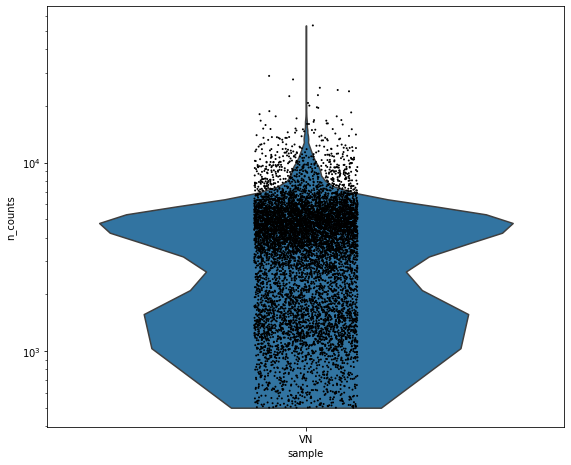

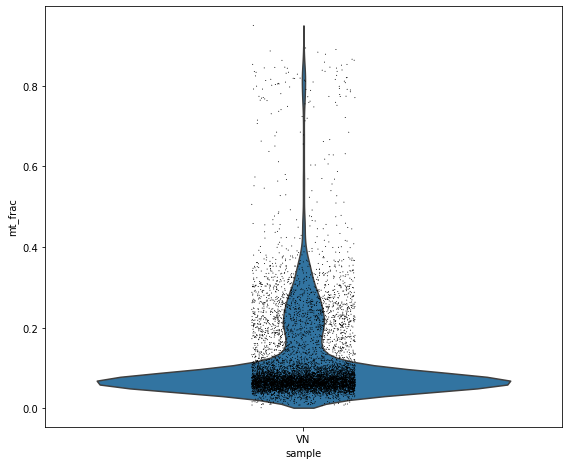

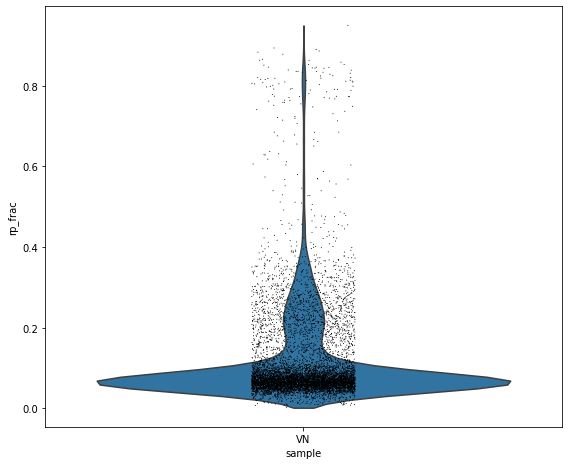

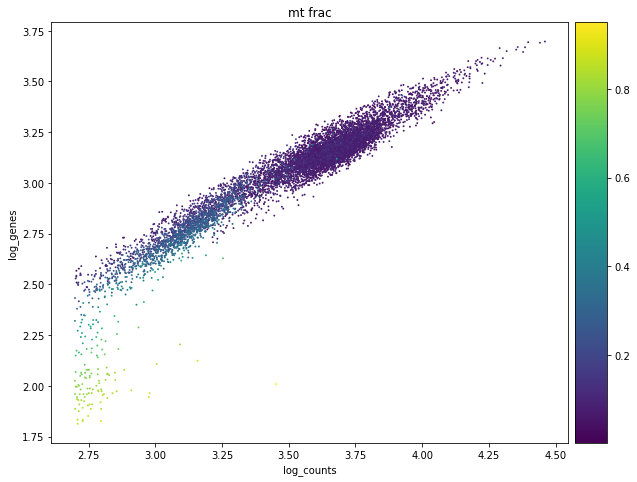

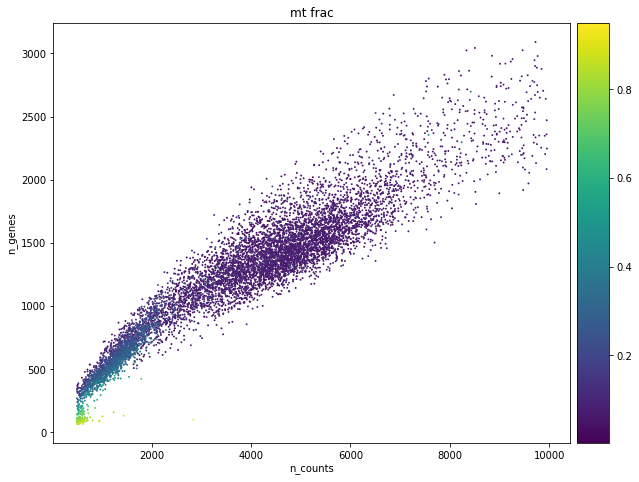

computing PCA
    with n_comps=50
    finished (0:00:10)


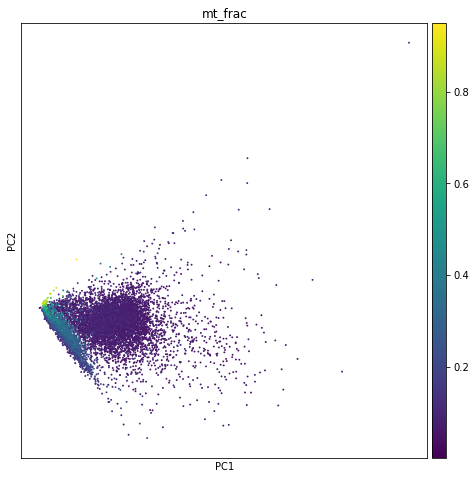

... storing 'sample' as categorical
... storing 'feature_types' as categorical


Mean genes-2*std: 375
Mean genes+2*std: 3480
Mean counts-2*std: 835
Mean counts+2*std: 13240
229850_Vedo_plus


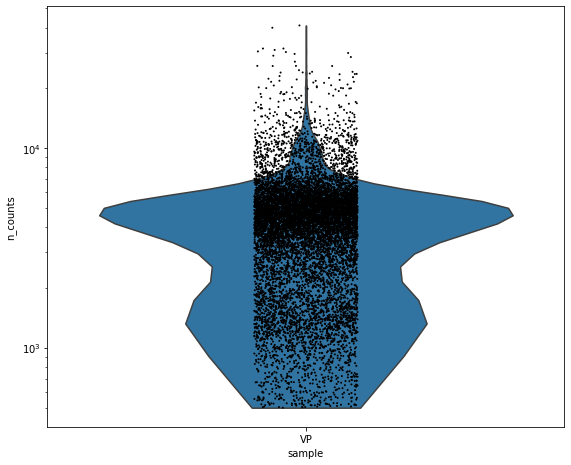

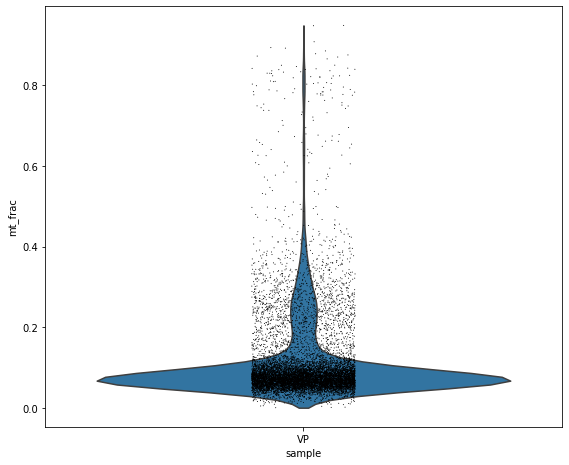

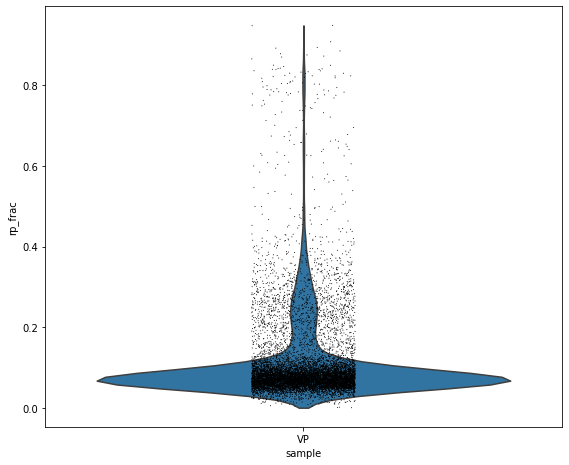

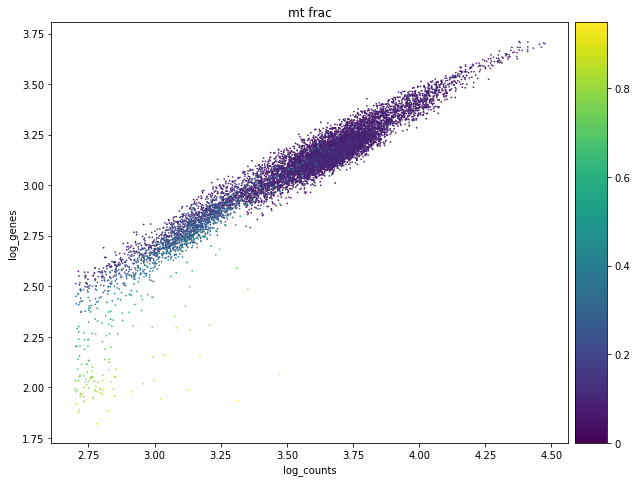

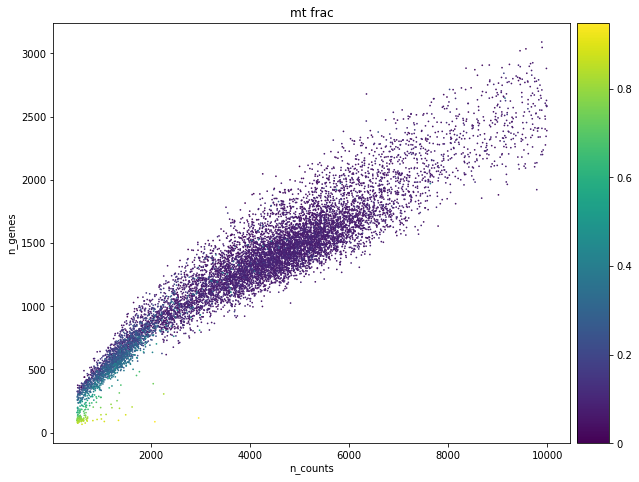

computing PCA
    with n_comps=50
    finished (0:00:18)


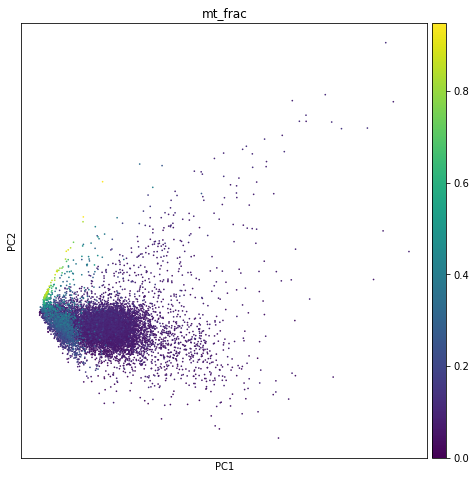

Mean genes-2*std: 434
Mean genes+2*std: 3555
Mean counts-2*std: 981
Mean counts+2*std: 14143


In [7]:

def PlotSamps(adata,printInfo,extraplots):
    t1 = sc.pl.violin(adata, 'n_counts', groupby='sample', size=2, log=True, cut=0)
    t2 = sc.pl.violin(adata, 'mt_frac', groupby='sample')
    t3 = sc.pl.violin(adata, 'rp_frac', groupby='sample')
    
    p1 = sc.pl.scatter(adata[adata.obs['n_counts']<30000], 'log_counts', 'log_genes', color='mt_frac')
    p2 = sc.pl.scatter(adata[adata.obs['n_counts']<10000], 'n_counts', 'n_genes', color='mt_frac')
    sc.tl.pca(adata, svd_solver='arpack')
    px1 = sc.pl.pca(adata, color='mt_frac')
    
    if extraplots:
        p3 = sb.distplot(adata.obs['n_counts'], kde=False)
        plt.show()

        p4 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']<1000], kde=False, bins=60)
        plt.show()

        p5 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']>15000], kde=False, bins=60)
        plt.show()

        p6 = sb.distplot(adata.obs['n_genes'], kde=False, bins=60)
        plt.show()

        p7 = sb.distplot(adata.obs['n_genes'][adata.obs['n_genes']<500], kde=False, bins=60)
        plt.show()


    if printInfo:
        GLC = int(round(10**(np.mean(np.log10([adata.obs['n_genes']]))-(2*np.std(np.log10([adata.obs['n_genes']]))))))

        GHC = int(round(10**(np.mean(np.log10([adata.obs['n_genes']]))+(2*np.std(np.log10([adata.obs['n_genes']]))))))

        CLC = int(round(10**(np.mean(np.log10([adata.obs['n_counts']]))-(2*np.std(np.log10([adata.obs['n_counts']]))))))
        CHC = int(round(10**(np.mean(np.log10([adata.obs['n_counts']]))+(2*np.std(np.log10([adata.obs['n_counts']]))))))
        print("Mean genes-2*std: "+str(GLC))
        print("Mean genes+2*std: "+str(GHC))
        print("Mean counts-2*std: "+str(CLC))
        print("Mean counts+2*std: "+str(CHC))

for i in range(0,len(TempDict)):
    print(list(TempDict.keys())[i])
    PlotSamps(TempDict[list(TempDict.keys())[i]],True,False)


In [8]:






def filterSamps(adata,LC,UC,LG):
    print('Total number of cells: {:d}'.format(adata.n_obs))

    sc.pp.filter_cells(adata, min_counts = LC)
    print('Number of cells after min count filter: {:d}'.format(adata.n_obs))

    sc.pp.filter_cells(adata, max_counts = UC)
    print('Number of cells after max count filter: {:d}'.format(adata.n_obs))

    adata = adata[adata.obs['mt_frac'] < 0.2]
    print('Number of cells after MT filter: {:d}'.format(adata.n_obs))

    adata = adata[adata.obs['rp_frac'] < 0.2]
    print('Number of cells after RP filter: {:d}'.format(adata.n_obs))
        
    sc.pp.filter_cells(adata, min_genes = LG)
    print('Number of cells after gene filter: {:d}'.format(adata.n_obs))


    adata = adata[adata.obs['CD3D'] > 0]
    print('Number of cells after CD3D filter: {:d}'.format(adata.n_obs))

    return(adata)

#Here we filter out all cells that have less than 1000 or more than 15000 UMIs. Also the cells with less than 500 expressed genes will be removed.
lower_count = [1000,1000]
upper_count = [15000,15000]
lower_ngene = [500,500]

for i in range(0,len(TempDict)):
    
    TempDict[list(TempDict.keys())[i]] = filterSamps(TempDict[list(TempDict.keys())[i]],lower_count[i],upper_count[i],lower_ngene[i])
    #filterSamps(TempDict[list(TempDict.keys())[i]],lower_count[i],upper_count[i],lower_ngene[i])

filtered out 556 cells that have less than 1000 counts


Total number of cells: 8297


filtered out 35 cells that have more than 15000 counts


Number of cells after min count filter: 7741
Number of cells after max count filter: 7706
Number of cells after MT filter: 6788
Number of cells after RP filter: 6788


filtered out 10 cells that have less than 500 genes expressed
Trying to set attribute `.obs` of view, copying.
filtered out 544 cells that have less than 1000 counts


Number of cells after gene filter: 6778
Number of cells after CD3D filter: 6072
Total number of cells: 10787


filtered out 98 cells that have more than 15000 counts


Number of cells after min count filter: 10243
Number of cells after max count filter: 10145
Number of cells after MT filter: 9176
Number of cells after RP filter: 9176


filtered out 10 cells that have less than 500 genes expressed
Trying to set attribute `.obs` of view, copying.


Number of cells after gene filter: 9166
Number of cells after CD3D filter: 8322


In [9]:
#If you use this with other datasets, make sure to join outer in concatenate and replace NAs to zero with np.


adata = TempDict[list(TempDict.keys())[0]]
for i in range(1,len(TempDict)):

    # Concatenate to main adata object
    adata = adata.concatenate(TempDict[list(TempDict.keys())[i]], batch_key='sample_id',join='outer')
    #adata.var['gene_id'] = adata.var['gene_id-1']
    #adata.var.drop(columns = ['gene_id-1', 'gene_id-0'], inplace=True)
    adata.obs.drop(columns=['sample_id'], inplace=True)
    adata.obs_names = [c.split("-")[0] for c in adata.obs_names]
    adata.obs_names_make_unique(join='_')

adata.X = np.nan_to_num(adata.X)


In a copy of adata, the data is normalized, 

In [10]:
sc.pp.filter_genes(adata, min_cells=1) #We have to removed all genes expressed in less than 1 cell, otherwise the PCA won't work.

#Perform a clustering for scran normalization in clusters
adata_pp = adata.copy()
sc.pp.normalize_per_cell(adata_pp, counts_per_cell_after=1e6)
sc.pp.log1p(adata_pp)
sc.pp.pca(adata_pp, n_comps=15)
sc.pp.neighbors(adata_pp)
sc.tl.louvain(adata_pp, key_added='groups', resolution=0.5)

#Preprocess variables for scran normalization
input_groups = adata_pp.obs['groups']
data_mat = adata.X.T

filtered out 12681 genes that are detected in less than 1 cells
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
computing PCA
    with n_comps=15
    finished (0:00:07)
computing neighbors
    using 'X_pca' with n_pcs = 15
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:20)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 8 clusters and added
    'groups', the cluster labels (adata.obs, categorical) (0:00:01)


In [11]:
del adata.obs['CD3D'] # So it does not intervere with the .var_names 

In [12]:
%%R -i data_mat -i input_groups -o size_factors

size_factors = computeSumFactors(data_mat, clusters=input_groups, min.mean=0.1)


In [13]:

#Delete adata_pp
try:
    del adata_pp
except:
    pass

# Visualize the estimated size factors
adata.obs['size_factors'] = size_factors

#Keep the count data in a counts layer
adata.layers["counts"] = adata.X.copy()
#Normalize adata 
adata.X /= adata.obs['size_factors'].values[:,None]
sc.pp.log1p(adata)
adata.raw = adata
sc.pp.highly_variable_genes(adata, flavor='cell_ranger', n_top_genes=4000)

# Calculate the visualizations
sc.pp.pca(adata, n_comps=8, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(adata)

sc.tl.tsne(adata, n_jobs=8) #Note n_jobs works for MulticoreTSNE, but not regular implementation)
sc.tl.umap(adata)
sc.tl.diffmap(adata)
sc.tl.draw_graph(adata)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=8
    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 8
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing tSNE
    using 'X_pca' with n_pcs = 8
    using sklearn.manifold.TSNE with a fix by D. DeTomaso
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:20)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:09)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transit

In [14]:
resolution=[0.50,0.75,1,2,5]

for x in resolution:


    # Perform clustering - using highly variable genes
    sc.tl.louvain(adata, resolution=x, key_added='louvain_r'+str(x), random_state=10)
    sc.tl.leiden(adata, resolution=x, key_added='leiden_r'+str(x), random_state=10)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 6 clusters and added
    'louvain_r0.5', the cluster labels (adata.obs, categorical) (0:00:01)
running Leiden clustering
    finished: found 7 clusters and added
    'leiden_r0.5', the cluster labels (adata.obs, categorical) (0:00:01)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 10 clusters and added
    'louvain_r0.75', the cluster labels (adata.obs, categorical) (0:00:01)
running Leiden clustering
    finished: found 11 clusters and added
    'leiden_r0.75', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 12 clusters and added
    'louvain_r1', the cluster labels (adata.obs, categorical) (0:00:01)
running Leiden clustering
    finished: found 14 clusters and added
    'leiden_r1', the cluster labels (adata.obs, categorical) (0:00:01)
running 

Visualisation
-

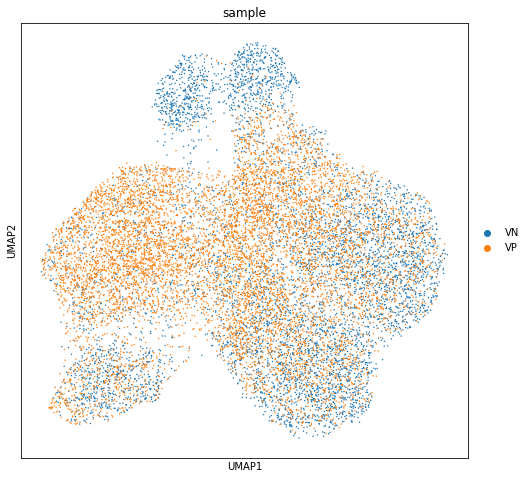

In [15]:
sc.pl.umap(adata, color=['sample'])

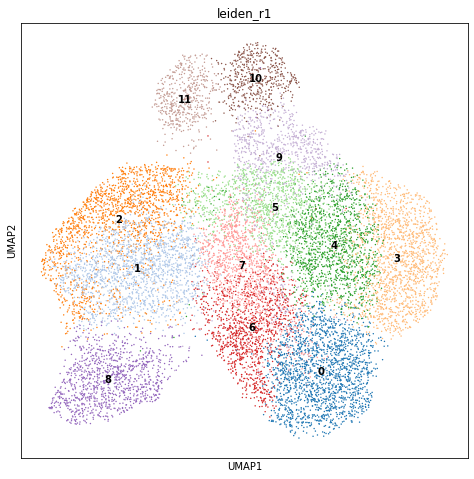

In [16]:
sc.pl.umap(adata, color=['leiden_r1'], palette=sc.pl.palettes.vega_20,legend_loc="on data")


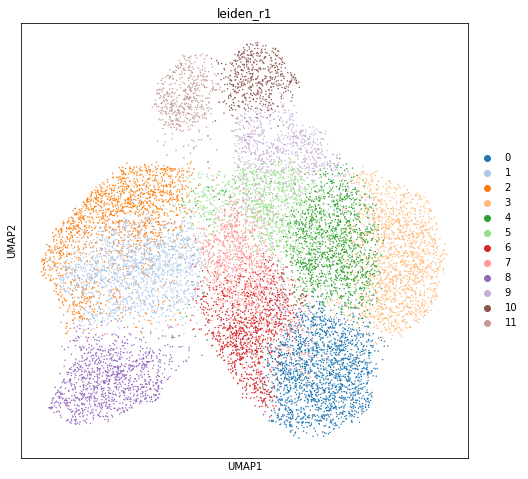

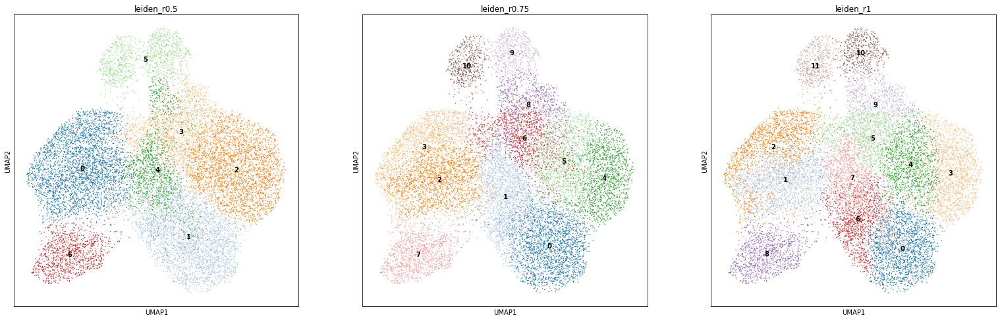

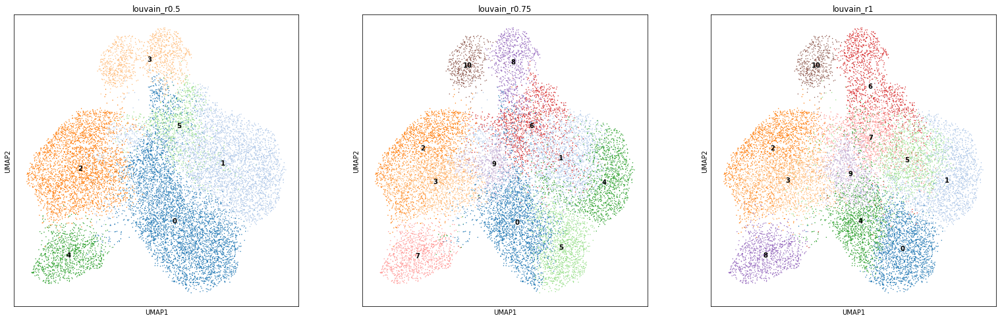

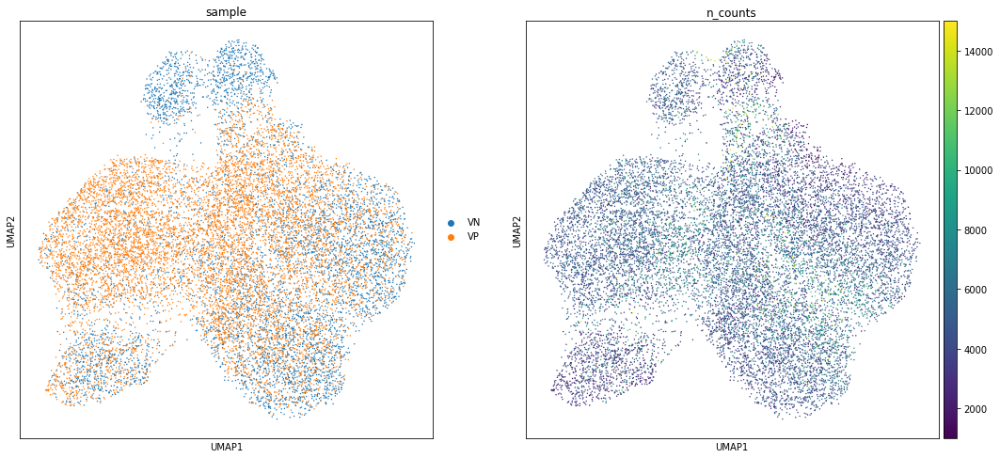

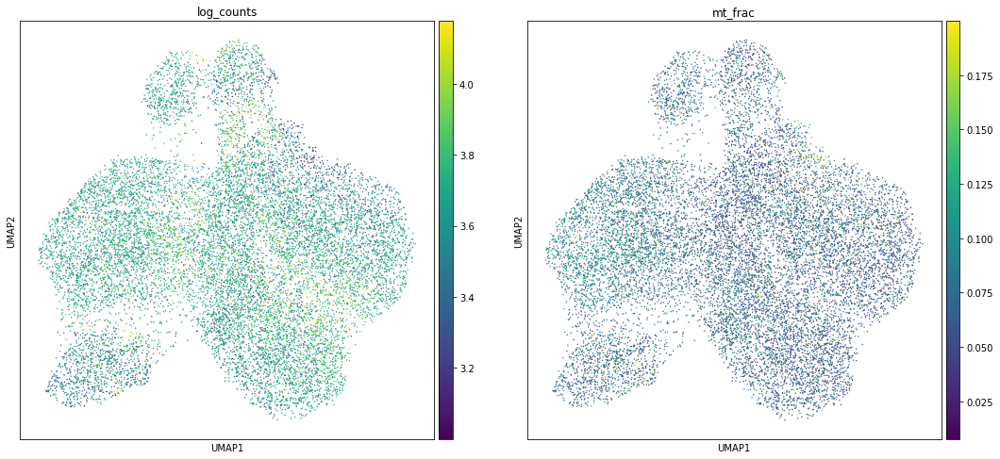

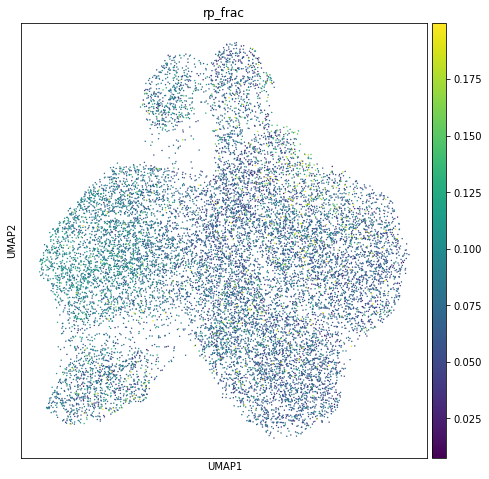

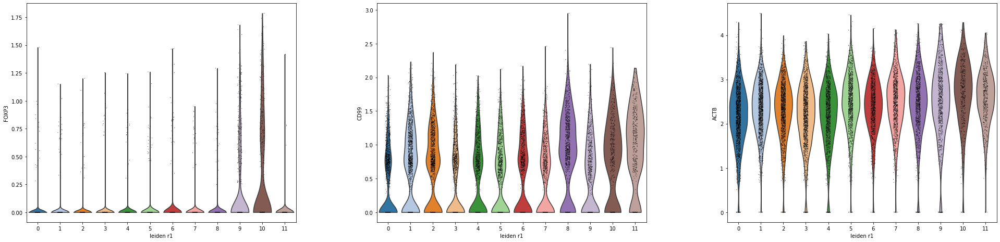

In [17]:


#Visualize the clustering and how this is reflected by different technical covariates
sc.pl.umap(adata, color=['leiden_r1'], palette=sc.pl.palettes.vega_20)

sc.pl.umap(adata, color=['leiden_r0.5','leiden_r0.75','leiden_r1'], palette=sc.pl.palettes.vega_20,legend_loc='on data')

sc.pl.umap(adata, color=['louvain_r0.5','louvain_r0.75','louvain_r1'], palette=sc.pl.palettes.vega_20,legend_loc='on data')
sc.pl.umap(adata, color=['sample', 'n_counts'])
sc.pl.umap(adata, color=['log_counts', 'mt_frac'])
sc.pl.umap(adata, color=['rp_frac'])
for x in ['leiden_r1']:
    sc.pl.violin(adata,['FOXP3','CD99',"ACTB"],groupby=x)


In [18]:

#Define a nice colour map for gene expression
colors2 = plt.cm.Reds(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)


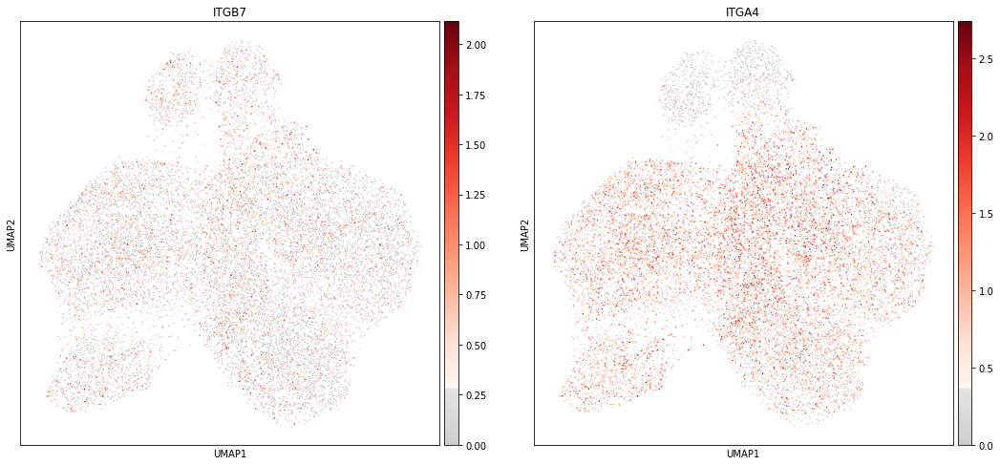

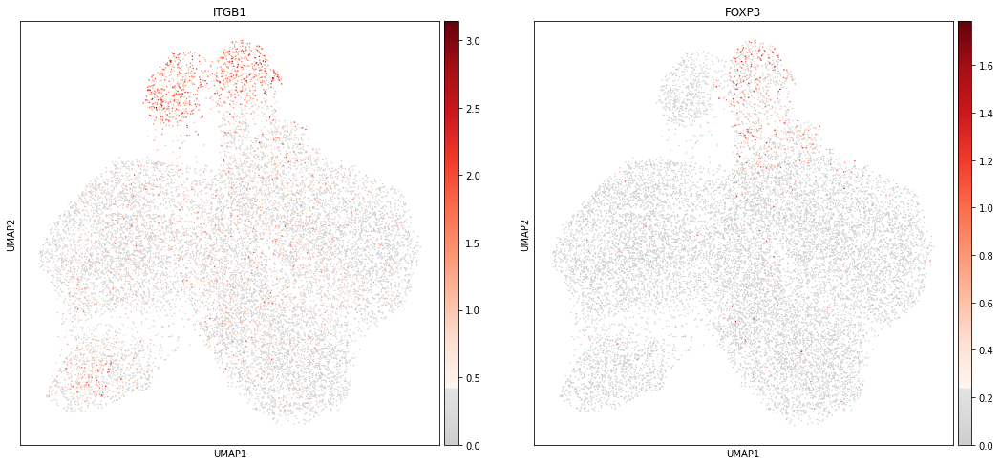

In [19]:
sc.pl.umap(adata, color=['ITGB7','ITGA4'], use_raw=False, color_map=mymap)
sc.pl.umap(adata, color=['ITGB1','FOXP3'], use_raw=False, color_map=mymap)

In [20]:
checkk = (list(adata.var_names))
#Treg marker genes
def plota(inp,check):
    if inp in check:
        sc.pl.umap(adata, color=[inp], use_raw=False, color_map=mymap)
    else:
        print (str(inp)+" Is not found.")

In [21]:

TregMarker = ["IL2RA","IL2RB","CTLA4","DUSP4","FOXP3","IKZF2","IKZF4","RTKN2"]


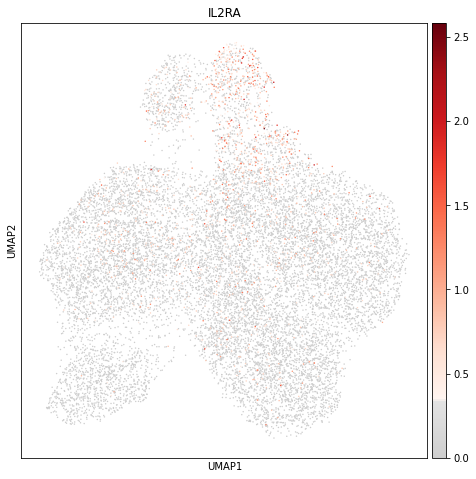

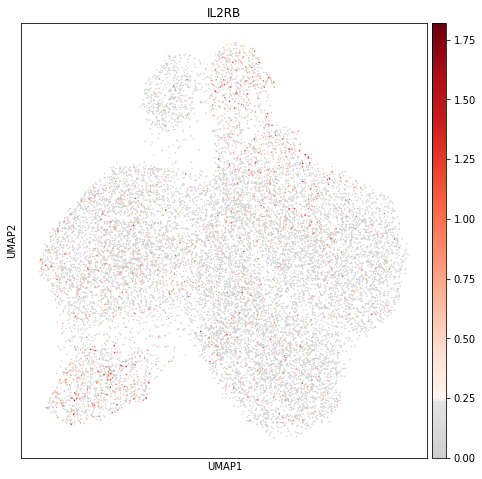

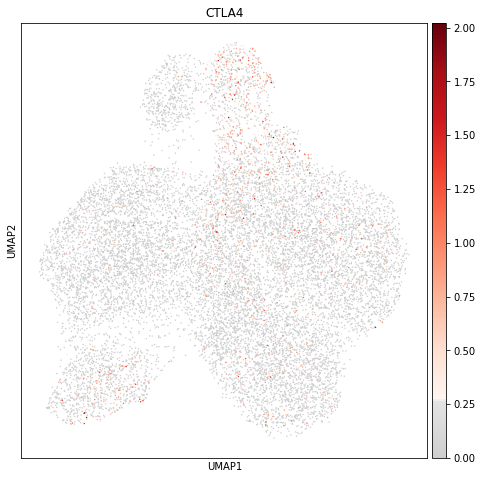

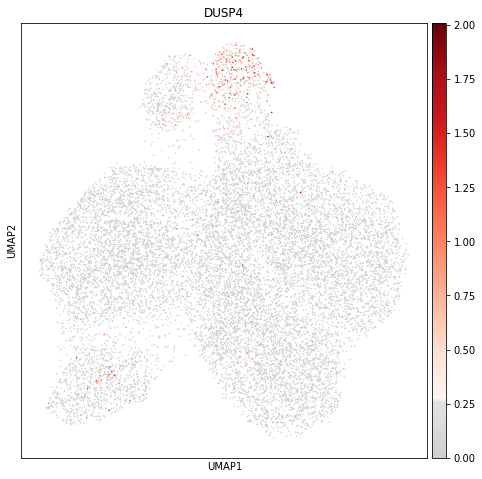

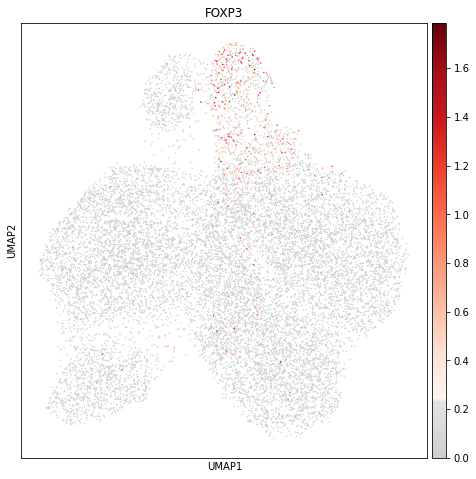

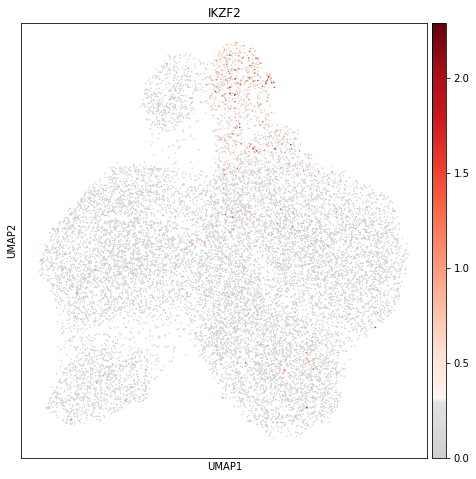

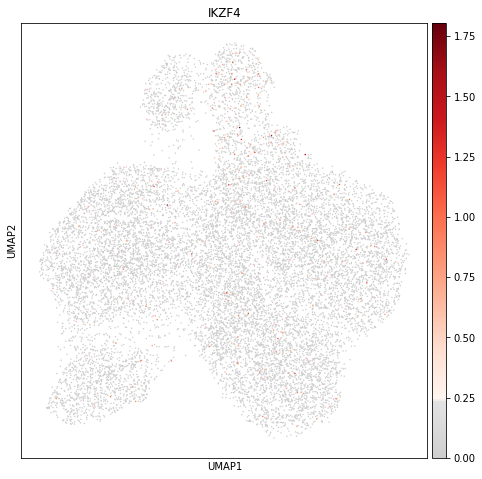

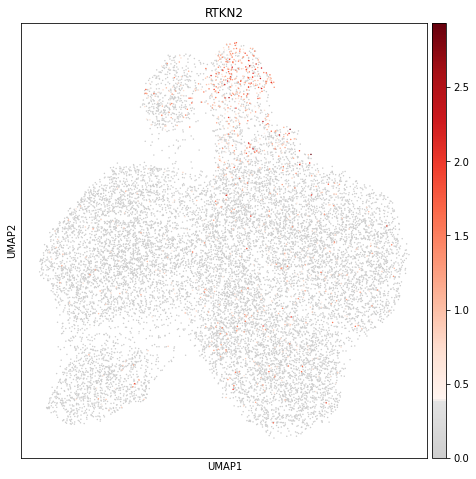

In [22]:
for x in TregMarker:
    plota(x,checkk)

Gene ranking and determining the Treg subcluster.
-

In this section, we define the Treg cluster by subclustering clusters that harbour many Treg markers. 

In [23]:



#Calculate marker genes
    sc.tl.rank_genes_groups(adata, groupby='leiden_r1', key_added='leiden_r1_rank')

ranking genes
    finished: added to `.uns['leiden_r1_rank']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:12)


In [24]:
#["IL2RA","IL2RB","CTLA4","DUSP4","FOXP3","IKZF2","IKZF4","RTKN2"]

marker_genes = dict()


marker_genes['IL2RA'] = ['IL2RA']
marker_genes['IL2RB'] = ['IL2RB']
marker_genes['CTLA4'] = ['CTLA4']
marker_genes['DUSP4'] = ['DUSP4']
marker_genes['FOXP3'] = ['FOXP3']
marker_genes['IKZF2'] = ['IKZF2']
marker_genes['IKZF4'] = ['IKZF4']
marker_genes['RTKN2'] = ['RTKN2']

In [25]:
cell_annotation = sc.tl.marker_gene_overlap(adata, marker_genes, key='leiden_r1_rank')
cell_annotation.to_excel('leiden_r1_.xlsx', sheet_name='sheet1', index=True)

In [26]:
cell_annotation

,0,1,2,3,4,5,6,7,8,9,10,11
IL2RA,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
IL2RB,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CTLA4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
DUSP4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
FOXP3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
IKZF2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
IKZF4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
RTKN2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0


In the table above, we see that cluster 9 and cluster 10 house many significantly upregulated Treg genes. Cluster 9 is located in the vedo positive region, where cluster 10 is dominantly vedo negative.

Using this informatio, we decided to subcluster 9 and 10.

In [27]:
for x in ['9','10']: # Initially, I ran this for all clusters. In this case, none of the other clusters seem to have subclusters with 3 or more Treg markers. If it would have been the case, these subclusters should also have been included.
    sc.tl.leiden(adata, restrict_to=('leiden_r1', [str(x)]), resolution=2, key_added='leiden_r1_sub_'+str(x))
    sc.tl.rank_genes_groups(adata, groupby='leiden_r1_sub_'+str(x), key_added='leiden_r1_sub_'+str(x)+'_ranked')


In [28]:



#If rerunning from scratch, the Treg clusters can be different, so it would need to be adjusted in the code.
for x in ['9','10']:
    cell_annotation =sc.tl.marker_gene_overlap(adata, marker_genes, key='leiden_r1_sub_'+str(x)+'_ranked')
    cell_annotation.to_excel('leiden_sub_Cl'+str(x)+'_.xlsx', sheet_name='sheet1', index=True)



['9', '10']
['9,0', '9,1', '9,2', '9,3', '9,4', '9,5', '9,7', '9,8', '9,9', '9,10', '9,13', '9,15', '9,16']
['10,0', '10,1', '10,2', '10,3', '10,4', '10,5', '10,6', '10,7', '10,8', '10,9', '10,10', '10,11', '10,12', '10,13']


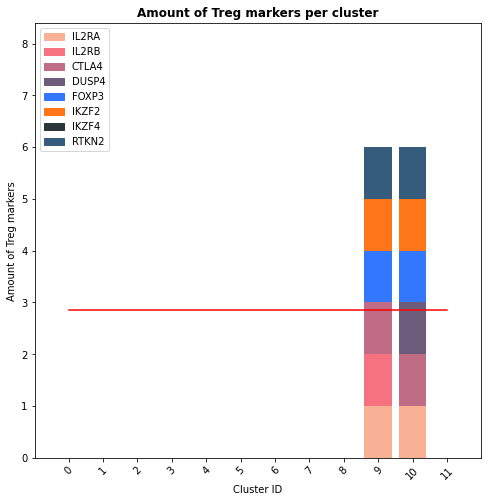

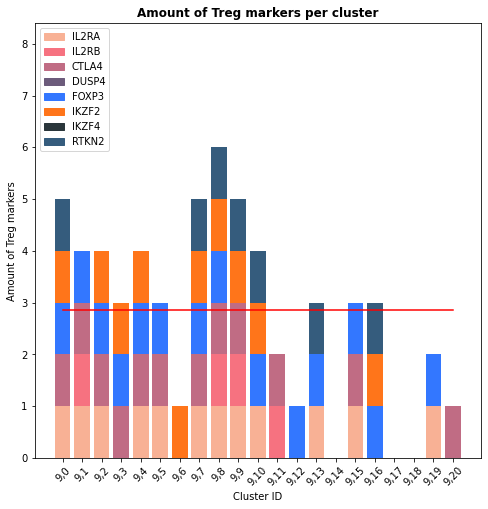

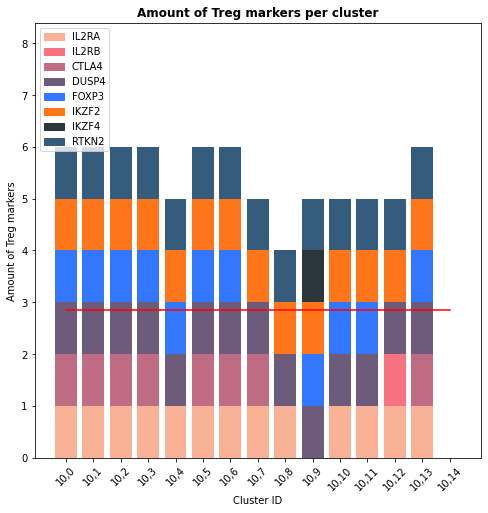

In [29]:
import matplotlib.pyplot as plt

for tt in ['leiden_r1_rank','leiden_r1_sub_9_ranked','leiden_r1_sub_10_ranked']:
    outp = []

    #c.tl.rank_genes_groups(adata, groupby='leiden_r1', key_added=tt)
    cell_annotation_all = sc.tl.marker_gene_overlap(adata, marker_genes, key=tt)

    IndexList = list(cell_annotation_all.columns)

    Add = []
    hhh = cell_annotation_all.T.to_dict('list')
    for pos1,uu in enumerate(IndexList):
        if "," in uu or tt == 'leiden_r1_rank': 

            Add.append(pos1)

    NewList = []
    for d in Add:

        NewList.append(IndexList[d])
    IndexList = NewList

    for kk in hhh:
        NewList = []
        for d in Add:
            NewList.append(hhh[kk][d])

        hhh[kk] = NewList


    prev = []
    for hh in hhh['IL2RA']:
        prev.append(0)


    fig = plt.figure()
    ax = fig.add_subplot(111)


    colorsX = {'IL2RA':"#F8B195",'IL2RB':"#F67280",'CTLA4':"#C06C84",'DUSP4':"#6C5B7B",'FOXP3':"#3377ff", 'IKZF2':"#ff751a",'IKZF4':"#2A363B",'RTKN2':"#355C7D"}      
    labels = list(colorsX.keys())
    handles = [plt.Rectangle((0,0),3,1, color=colorsX[label]) for label in labels]
    bla = True
    for gg in hhh:
        if bla:
            ax.bar(IndexList,height=8,color="#ffffff",data=hhh[gg])
            bla = False

        ax.bar(IndexList,hhh[gg],color=colorsX[gg],bottom = prev)
        zipped_lists = zip(prev, hhh[gg])
        prev = [x + y for (x, y) in zipped_lists]

        #ax.bar(IndexList,Foxp3List,color="#3377ff")
    for pos1,l in enumerate(prev):
        if l > 2:
            outp.append(IndexList[pos1])
    ax.plot(IndexList,[2.85]*len(hhh[gg]),color="r")
    plt.xticks(rotation=45)
    
    plt.title('Amount of Treg markers per cluster',weight='bold')

    plt.xlabel('Cluster ID')

    plt.ylabel('Amount of Treg markers')
    
    
    leg1 = ax.legend(handles, labels,loc = 2)
    #leg2 = ax.legend(handles2, labels2,loc = 1)
    #ax.add_artist(leg1)
    #ax.show()
    print(outp)

We make three different groups: 2 Treg groups defined differently and one FOXP3+ group.

The first Treg group is defined by subclusters that have more than 3 significant genes expressed in the subcluster, based on the Scanpy ranking mechanism required before running the scanpy tl.marker_gene_overlap() function. 

The second Treg group, is not based on clustering, but merely on cells that express 3 or more Treg genes.

The FOXP3 group, basically are all cells that express FOXP3. This group is needed to see if there are many FOXP3+ cells who are not located within one of the two groups defined above.

In [30]:
"""
The (sub)clusters have more than 3 Treg markers, will be renamed to the Group1 Treg cluster.
"""

aaa = ['9,0', '9,1', '9,2', '9,3', '9,4', '9,5', '9,7', '9,8', '9,9', '9,10', '9,13', '9,15', '9,16','10,0', '10,1', '10,2', '10,3', '10,4', '10,5', '10,6', '10,7', '10,8', '10,9', '10,10', '10,11', '10,12', '10,13']
#You can copy this from the output of the barplot. Just use the comma values only.


In [31]:
b = []
a = []
for num in range(len(adata.obs)):
    cont = False
    for x in ['9','10']:
        if adata.obs['leiden_r1_sub_'+x][num] in aaa:
            a.append("Treg")
            b.append(adata.obs['leiden_r1_sub_'+x][num])
            
            cont = True
            break
    if cont == True:
        continue
            
    a.append('Other')
    if adata.obs['leiden_r1_sub_'+x][num].startswith(x):
        b.append(x)
    else:
        b.append(adata.obs['leiden_r1_sub_'+x][num])


In [32]:
adata.obs['Leiden_sub_9_10'] = b
adata.obs['Group1_CellType'] = a


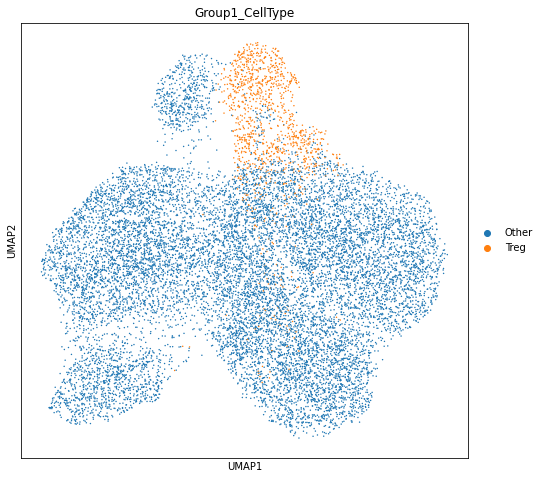

In [33]:
sc.pl.umap(adata, color=['Group1_CellType'], use_raw=False, color_map=mymap)

In [34]:
adata_not_treg = adata[adata.obs['Group1_CellType'] != "Treg"].copy()

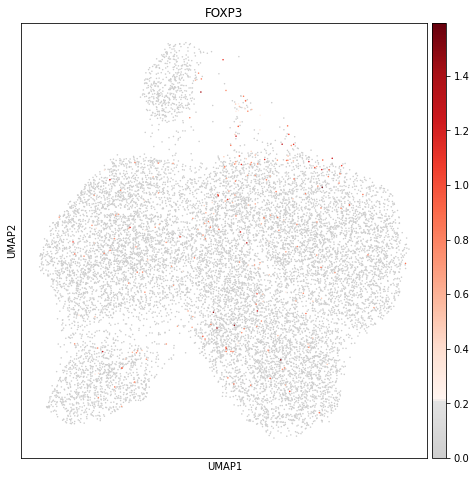

In [35]:
sc.pl.umap(adata_not_treg, color=['FOXP3'], use_raw=False, color_map=mymap)

In [36]:
#This code defines the third group, the FOXP3+ cells. 
foxp3 = [gene == "FOXP3" for gene in adata.var_names]
FOXP3List = []
for x in adata.X[:, foxp3]:
    if x > 0:
        FOXP3List.append('FOXP3')
    else:
        FOXP3List.append('Other')
adata.obs['Group3_CellType'] = FOXP3List

In [37]:
"""This code defines the second group of Treg. There will be for sure be cells that are in both Treg groups.
The code counts for each cell, how many treg markers it expresses. 
If it expressed 3 or more of these marker genes, it will be added to another object that specifies all cells having 3 or more Treg markers.
Additionally, this code also gives us insight in how many of the Treg subclusters as defined above, actually have 3 or more treg markers.
"""
CountList = []
CountListVPOther = []
CountListVNOther = []
CountListVPTreg = []
CountListVNTreg = []

CountListVPFoxp3 = []
CountListVPFoXOther = []
CountListVNFoxp3 = []
CountListVNFoXOther = []

CountsRecord = []
TregByCount = []
for y in range(len(adata.obs)):
    Count = 0
    for x in range(len(adata.var_names)):
        if adata.var_names[x] in ["IL2RA","IL2RB","CTLA4","DUSP4","FOXP3","IKZF2","IKZF4","RTKN2"]:

            if adata.X[y,x] > 0:
                Count = Count + 1
    CountList.append(Count)
    if adata.obs['sample'][y] == 'VP':
        if adata.obs['Group1_CellType'][y] == 'Treg':
            CountListVPTreg.append(Count)
        elif adata.obs['Group1_CellType'][y] == 'Other':
            CountListVPOther.append(Count)
        if adata.obs['Group3_CellType'][y] == 'FOXP3':
            CountListVPFoxp3.append(Count)
        elif adata.obs['Group3_CellType'][y] == 'Other':
            CountListVPFoXOther.append(Count)
    elif adata.obs['sample'][y] == 'VN':
        if adata.obs['Group1_CellType'][y] == 'Treg':
            CountListVNTreg.append(Count)
        elif adata.obs['Group1_CellType'][y] == 'Other':
            CountListVNOther.append(Count)
        if adata.obs['Group3_CellType'][y] == 'FOXP3':
            CountListVNFoxp3.append(Count)
        elif adata.obs['Group3_CellType'][y] == 'Other':
            CountListVNFoXOther.append(Count)
    else:
        print("Error")
    CountsRecord.append(Count) # Here we keep counts for each cell and make it into an object for adata.
    if Count > 2: #If there are 3 or more Treg markers in a cell.
        TregByCount.append('Treg')
    else:
        TregByCount.append('Other')

In [38]:

from collections import Counter
#amount of detected tregmarkers: Amount of cells. For example 2: 66 mean that there are 66 cells with 2 detected treg markers.
print(Counter(CountListVPTreg)) 
print(Counter(CountListVNTreg))
print(Counter(CountListVPOther))
print(Counter(CountListVNOther))
adata.obs['TregMarkerCount'] = CountsRecord
adata.obs['Group2_CellType'] = TregByCount

Counter({1: 106, 2: 93, 3: 74, 0: 65, 4: 59, 5: 14, 6: 7, 7: 3})
Counter({3: 155, 2: 148, 1: 127, 4: 94, 0: 81, 5: 77, 6: 33, 7: 6, 8: 1})
Counter({0: 5883, 1: 1611, 2: 297, 3: 78, 4: 19, 5: 10, 6: 3})
Counter({0: 3947, 1: 1099, 2: 219, 3: 65, 4: 12, 5: 7, 7: 1})


In [39]:
"""
This function creates 3 extra objects for the input Group out of the existing 'CellType' object (adata.obs['Group1_CellType']. var in this case is either Treg or FOXP3. 
SampCellType has VP_Treg/VN_Treg or VP_Other/VN_Other #Used for plots
SampCellType2 has VP_Treg/VN_Treg or Other #Used for plots
SampCellType3 has Treg or Other. #Used for differential expression
"""

def CreateCellTypeObs(adata,Group,var):
    Mix = []
    Mix2 = []
    Mix3 = []
    for x in range(len(adata.obs[Group+'_CellType'])):
        if adata.obs[Group+'_CellType'][x] == var:
            Mix.append(adata.obs['sample'][x] + "_"+var)
            Mix2.append(adata.obs['sample'][x] + "_"+var)
            Mix3.append(var)
        else:
            Mix.append("Other") 
            Mix2.append(adata.obs['sample'][x] + "_Other")
            Mix3.append("Other")
    adata.obs[Group+'_SampCellType'] = Mix
    adata.obs[Group+'_SampCellType2'] = Mix2
    adata.obs[Group+'_SampCellType3'] = Mix3
    return(adata)

In [40]:
#Create celltype objects for each group, which will be used later on.
adata = CreateCellTypeObs(adata,'Group1','Treg')
adata = CreateCellTypeObs(adata,'Group2','Treg')
adata = CreateCellTypeObs(adata,'Group3','FOXP3')

In [41]:
print(adata.obs['Group1_SampCellType'].value_counts())
print(adata.obs['Group1_SampCellType2'].value_counts())
print(adata.obs['Group1_SampCellType3'].value_counts())

Other      13251
VN_Treg      722
VP_Treg      421
Name: Group1_SampCellType, dtype: int64
VP_Other    7901
VN_Other    5350
VN_Treg      722
VP_Treg      421
Name: Group1_SampCellType2, dtype: int64
Other    13251
Treg      1143
Name: Group1_SampCellType3, dtype: int64


In [42]:
print(adata.obs['Group2_SampCellType'].value_counts())
print(adata.obs['Group2_SampCellType2'].value_counts())
print(adata.obs['Group2_SampCellType3'].value_counts())

Other      13676
VN_Treg      451
VP_Treg      267
Name: Group2_SampCellType, dtype: int64
VP_Other    8055
VN_Other    5621
VN_Treg      451
VP_Treg      267
Name: Group2_SampCellType2, dtype: int64
Other    13676
Treg       718
Name: Group2_SampCellType3, dtype: int64


In [43]:
print(adata.obs['Group3_SampCellType'].value_counts())
print(adata.obs['Group3_SampCellType2'].value_counts())
print(adata.obs['Group3_SampCellType3'].value_counts())

Other       13774
VN_FOXP3      318
VP_FOXP3      302
Name: Group3_SampCellType, dtype: int64
VP_Other    8020
VN_Other    5754
VN_FOXP3     318
VP_FOXP3     302
Name: Group3_SampCellType2, dtype: int64
Other    13774
FOXP3      620
Name: Group3_SampCellType3, dtype: int64


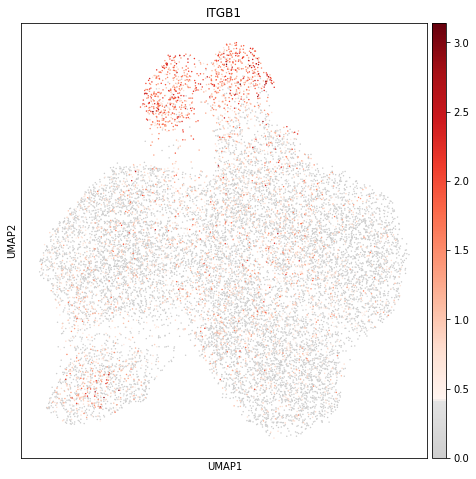

In [44]:
sc.pl.umap(adata, color=['ITGB1'], use_raw=False, color_map=mymap)

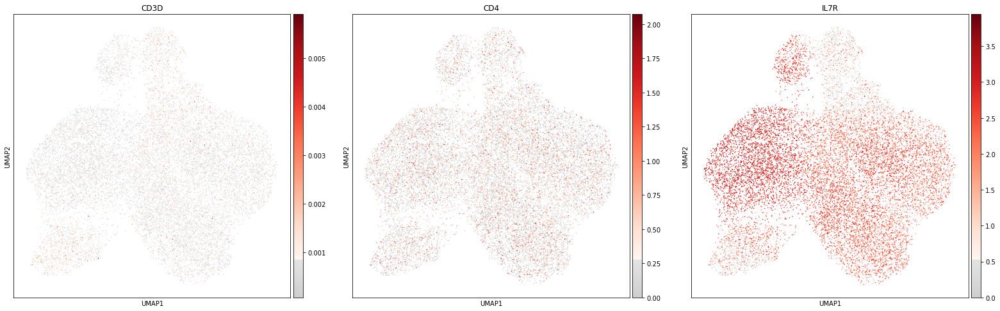

In [45]:
sc.pl.umap(adata, color=['CD3D','CD4','IL7R'], use_raw=False, color_map=mymap)

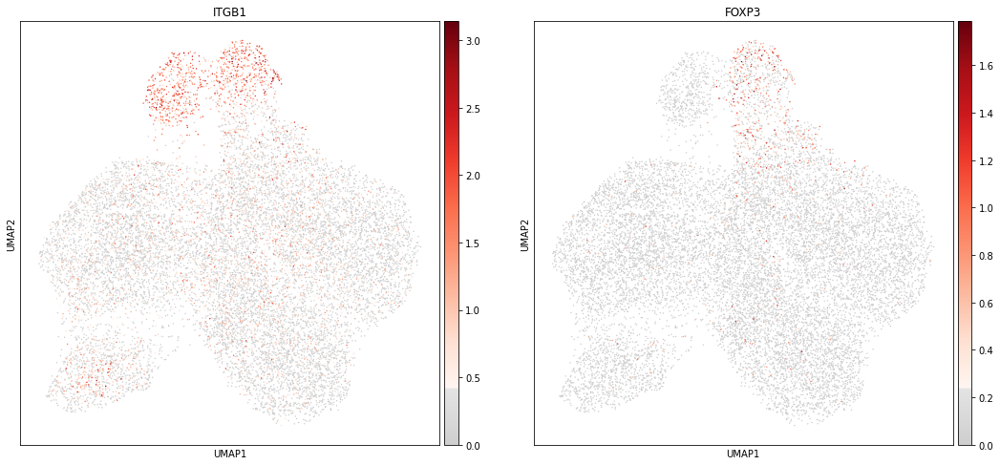

In [46]:
sc.pl.umap(adata, color=['ITGB1','FOXP3'], use_raw=False, color_map=mymap)

In [47]:
def RunAllPlots(adata,group,var):
    sc.pl.umap(adata, color=[group+'_SampCellType2'], use_raw=False ,palette=[(0.8, 0.4, 0.8, 0.00002),(1, 0, 0, 1),(0.7, 0.7, 0.7, 0.00002),(0, 0, 1, 1)])
    sc.pl.umap(adata, color=[group+'_SampCellType'], use_raw=False ,palette=[(0.7, 0.7, 0.7, 0.00002),(1, 0, 0, 1),(0, 0, 1, 1)])

    sc.pl.stacked_violin(adata, var_names=["CD3D","CD3E","CD3G","CD4","ITGA4","ITGB1","ITGB7","ITGAE","CD99","CCR9","CCR7","CCR10","CCR4","CCR6","CXCR4","IL7R","FOXP3","LMNA","FUT7","FANK1","DUSP4","CD38","IL2RA","IL2RB","CTLA4","DUSP4","IKZF2","IKZF4","RTKN2"],groupby=group+'_SampCellType2',multi_panel=True,order=["VN_"+var,"VP_"+var,"VN_Other","VP_Other"])

    sc.pl.stacked_violin(adata, var_names=["PI16","CCR10","CCR4","CCR6","CXCR4","ITGA4","ITGB1","ITGB7","ITGAE","CSGALNACT1","CD99","CCR9","CCR7","LMNA","FUT7","FANK1","DUSP4","CD38"],groupby=group+'_SampCellType2',multi_panel=True,order=["VN_"+var,"VP_"+var,"VN_Other","VP_Other"],swap_axes=True)

    sc.pl.stacked_violin(adata, var_names=["CD3D","CD3E","CD3G","CD4","IL7R","FOXP3","DUSP4","IL2RA","IL2RB","CTLA4","DUSP4","IKZF2","IKZF4","RTKN2"],groupby=group+'_SampCellType2',multi_panel=True,order=["VN_"+var,"VP_"+var,"VN_Other","VP_Other"],swap_axes=True)
    ax = sc.pl.dotplot(adata, ['CD4',"FOXP3","DUSP4","IL2RA","IL2RB","CTLA4","DUSP4","IKZF2","IKZF4","RTKN2"], groupby=group+'_SampCellType2')
    ax = sc.pl.dotplot(adata, ["CD3D","CD3E","CD3G","CD4","IL7R","FOXP3","DUSP4","IL2RA","IL2RB","CTLA4","DUSP4","IKZF2","IKZF4","RTKN2"], groupby=group+'_SampCellType2')
    ax = sc.pl.dotplot(adata, ["CCR10","CCR4","CCR6","CXCR4","ITGA4","ITGB1","ITGB7","ITGAE","CD99","CCR9","CCR7","LMNA","FUT7","FANK1","DUSP4","CD38"], groupby=group+'_SampCellType2')
    ax = sc.pl.dotplot(adata, ["CCR10","PI16","CCR9","ITGB1","CCR7","CD38"], groupby=group+'_SampCellType2')

All Group 1 (Treg derived from subclustering) related plots
-

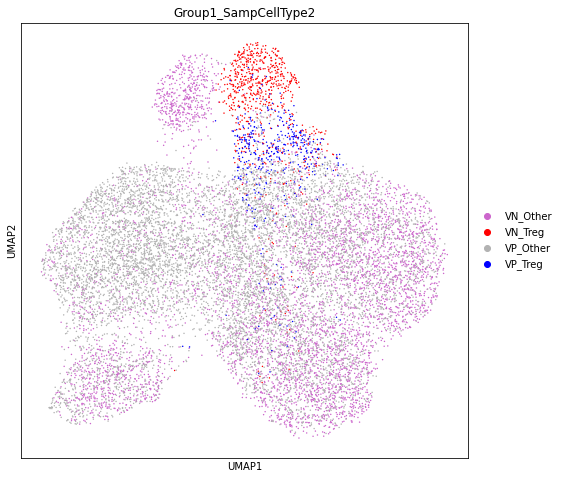

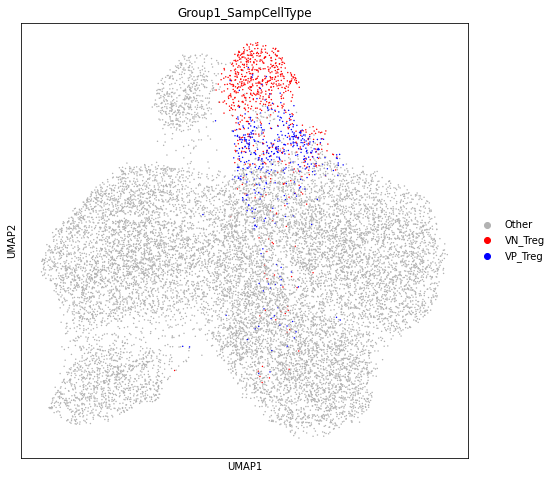

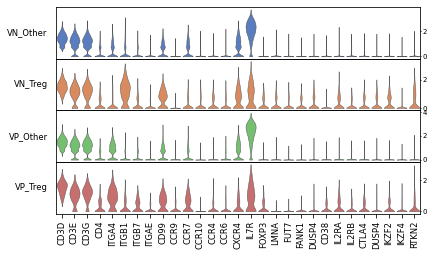

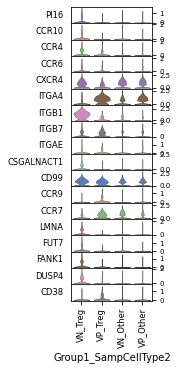

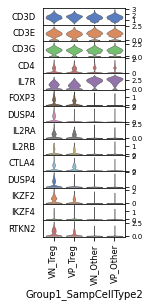

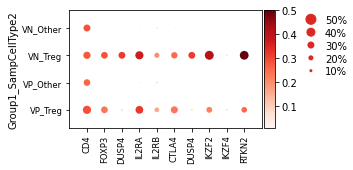

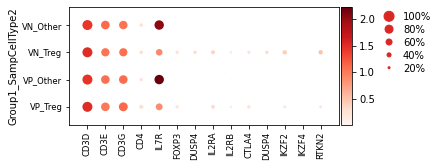

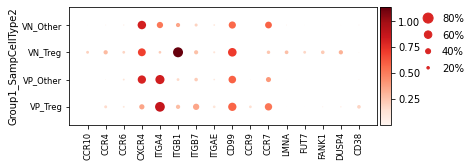

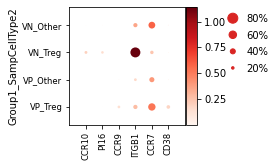

In [48]:
RunAllPlots(adata,'Group1','Treg')


All Group 2 (Cells with more than 3 Treg marker genes) related plots 
-

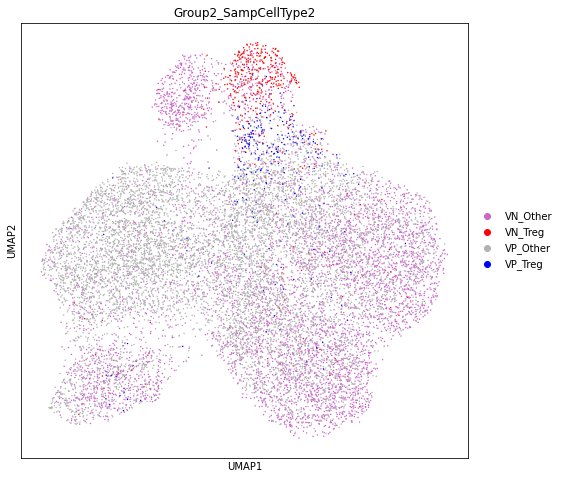

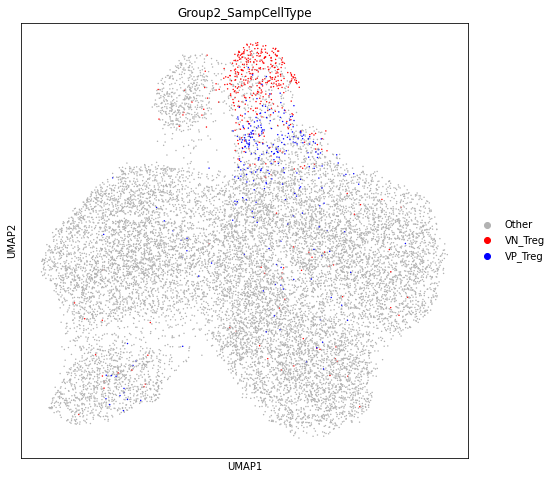

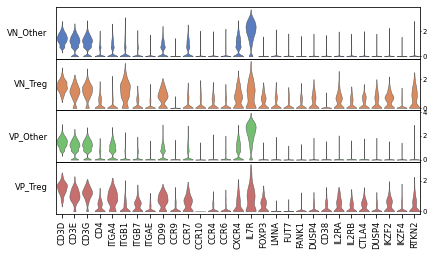

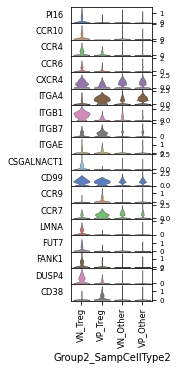

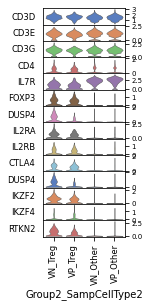

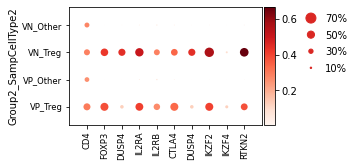

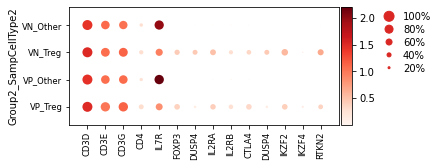

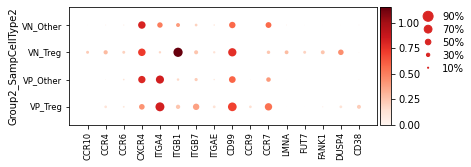

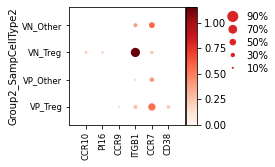

In [49]:
RunAllPlots(adata,'Group2','Treg')


All Group 3 (FOXP3+) related plots
-

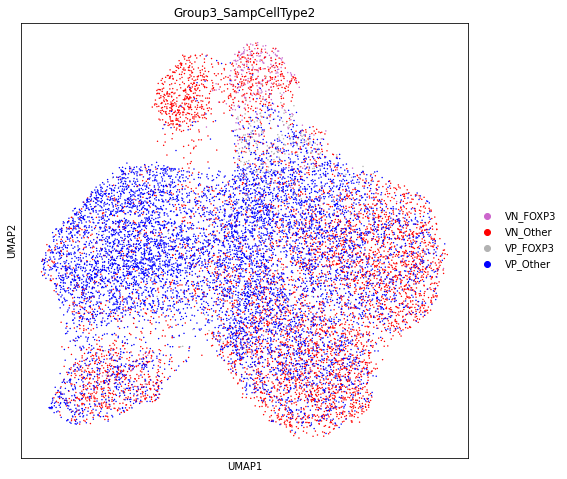

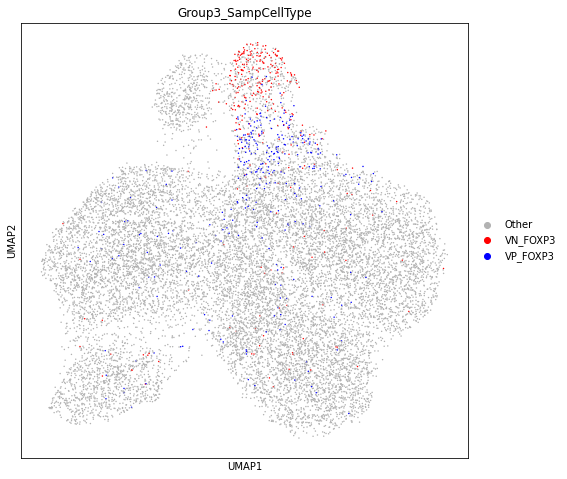

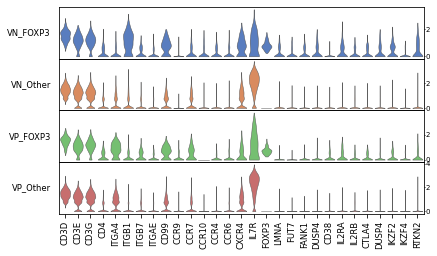

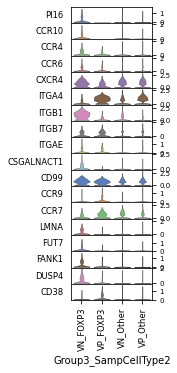

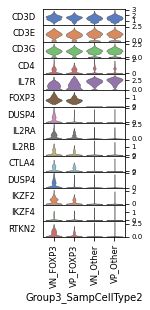

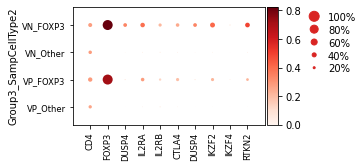

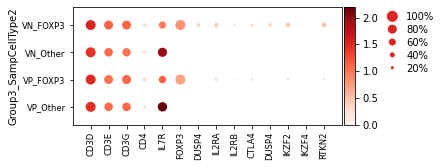

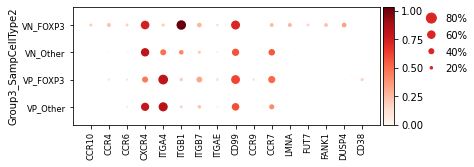

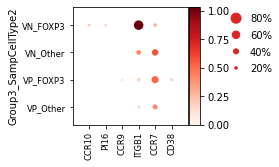

In [50]:
RunAllPlots(adata,'Group3','FOXP3')


Venndiagrams of all groups  
-

0 = Not in any group
1 = Only in group 1
2 = Only in group 2
3 = Only in group 3
4 = Group 1 + 2
5 = Group 1 + 3
6 = Group 2 + 3
7 = All groups


In [51]:
from matplotlib_venn import venn3, venn3_circles
def MakeVenn(adata):
    A1 = 0
    A2 = 0
    A3 = 0
    A4 = 0
    A5 = 0
    A6 = 0
    A7 = 0
    A0 = 0
    UnionList = []
    for x in range(len(adata.obs)):
        Union = "Other"
        G1 = False # Group 1
        G2 = False # Group 2
        G3 = False # Group FOXP3
        if adata.obs['Group1_CellType'][x] != 'Other':
            G1 = True
        if adata.obs['Group2_CellType'][x] != 'Other':
            G2 = True
        if adata.obs['Group3_CellType'][x] != 'Other':
            G3 = True
        if G1:
            if G2:
                if G3:
                    A7 = A7 + 1 #All groups for this cell are not Other.
                    Union = "Treg" #This is for group 4, union of group 2 and 3.
                else:
                    A4 = A4 + 1 #For this cell, only group 1 and group 2 have Treg, but group 3 does not have Foxp3+.
            else: #G1 is true but G2 is false.
                if G3: #Incase group 1 and 3 are true but group 2 is false.
                    A5 = A5 + 1
                else:
                    A1 = A1 + 1 # Only group 1 is true.
        elif G2: #G1 is False, so it does not have other.
            if G3:
                A6 = A6 + 1 # Group 2 and 3 are true, so A6 += 1
                Union = "Treg" #This is for group 4, union of group 2 and 3.
            else:
                A2 = A2 + 1 # If G1 and G3 are both false, but G2 is true, A2 += 1.
        elif G3: # Both G1 and G2 are false, but G3 is postive
            A3 = A3 + 1 #In this case we add to A3. Which means that it is a FOXP3+ cell with less than 3 Treg markers and also not located in the Treg subclusters.
        else:
            A0 = A0 + 1 # The cell is not in any of the three groups. This should be the majority of the cells
        UnionList.append(Union)
    adataCopy = adata.copy() #To prevent adata overwriting of mere samples
    adataCopy.obs['Group4_CellType'] = UnionList
    venn3(subsets = (A1, A2, A4, A3, A5, A6, A7), set_labels = ('Group 1', 'Group 2', 'FOXP3+ group'), alpha = 0.5);
    return(adataCopy)

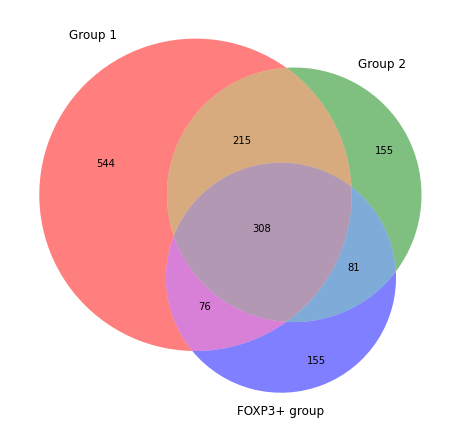

In [52]:
adata = MakeVenn(adata)

In [53]:
adata = CreateCellTypeObs(adata,'Group4','Treg')
Neg = adata[adata.obs['sample'] == 'VN']
Pos = adata[adata.obs['sample'] == 'VP']
Group1_Treg = adata[adata.obs['Group1_CellType'] == 'Treg']
Group2_Treg = adata[adata.obs['Group2_CellType'] == 'Treg']
Group3_FOXP3 = adata[adata.obs['Group3_CellType'] == 'FOXP3']
Group4_Treg = adata[adata.obs['Group4_CellType'] == 'Treg']

AnnData object with n_obs × n_vars = 8322 × 20857 
    obs: 'CD3D', 'log_counts', 'log_genes', 'mt_frac', 'n_counts', 'n_genes', 'rp_frac', 'sample', 'size_factors', 'louvain_r0.5', 'leiden_r0.5', 'louvain_r0.75', 'leiden_r0.75', 'louvain_r1', 'leiden_r1', 'louvain_r2', 'leiden_r2', 'louvain_r5', 'leiden_r5', 'leiden_r1_sub_8', 'leiden_r1_sub_9', 'leiden_r1_sub_5', 'leiden_r1_sub_10', 'Leiden_sub_9_10', 'Group1_CellType', 'Group3_CellType', 'TregMarkerCount', 'Group2_CellType', 'Group1_SampCellType', 'Group1_SampCellType2', 'Group1_SampCellType3', 'Group2_SampCellType', 'Group2_SampCellType2', 'Group2_SampCellType3', 'Group3_SampCellType', 'Group3_SampCellType2', 'Group3_SampCellType3', 'Group4_CellType', 'Group4_SampCellType', 'Group4_SampCellType2', 'Group4_SampCellType3', 'leiden_r0.75_sub_8', 'leiden_r0.75_sub_9'
    var: 'gene_ids-0', 'feature_types-0', 'gene_ids-1', 'feature_types-1', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'pca'

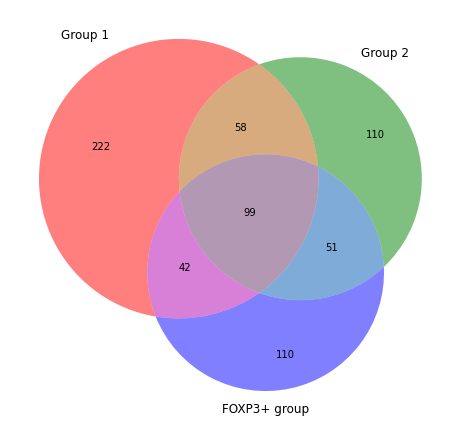

In [54]:
MakeVenn(Pos)

AnnData object with n_obs × n_vars = 6072 × 20857 
    obs: 'CD3D', 'log_counts', 'log_genes', 'mt_frac', 'n_counts', 'n_genes', 'rp_frac', 'sample', 'size_factors', 'louvain_r0.5', 'leiden_r0.5', 'louvain_r0.75', 'leiden_r0.75', 'louvain_r1', 'leiden_r1', 'louvain_r2', 'leiden_r2', 'louvain_r5', 'leiden_r5', 'leiden_r1_sub_8', 'leiden_r1_sub_9', 'leiden_r1_sub_5', 'leiden_r1_sub_10', 'Leiden_sub_9_10', 'Group1_CellType', 'Group3_CellType', 'TregMarkerCount', 'Group2_CellType', 'Group1_SampCellType', 'Group1_SampCellType2', 'Group1_SampCellType3', 'Group2_SampCellType', 'Group2_SampCellType2', 'Group2_SampCellType3', 'Group3_SampCellType', 'Group3_SampCellType2', 'Group3_SampCellType3', 'Group4_CellType', 'Group4_SampCellType', 'Group4_SampCellType2', 'Group4_SampCellType3', 'leiden_r0.75_sub_8', 'leiden_r0.75_sub_9'
    var: 'gene_ids-0', 'feature_types-0', 'gene_ids-1', 'feature_types-1', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'pca'

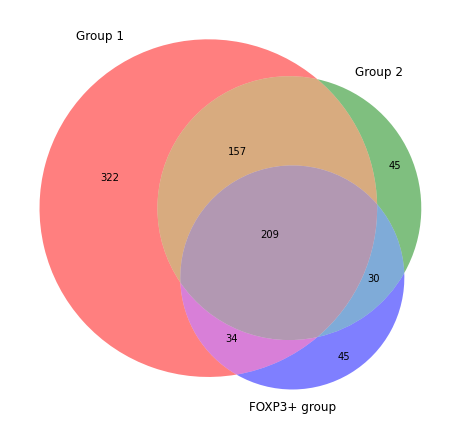

In [55]:
MakeVenn(Neg)

Group 4, union of group 2 and 3.
-

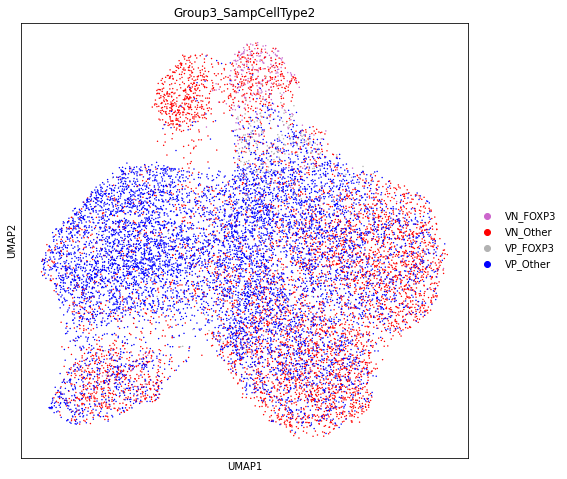

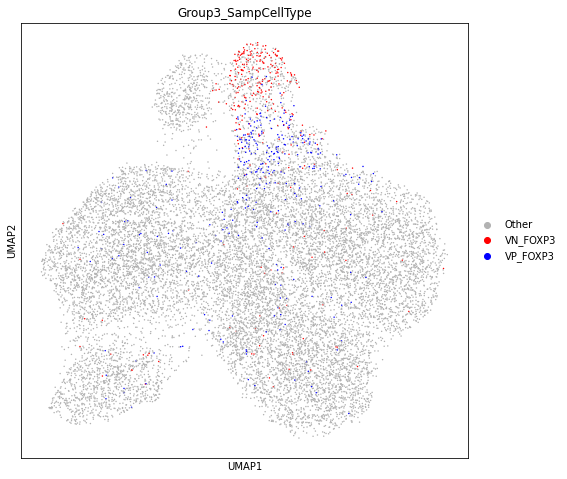

ERROR: Please check that the categories given by the `order` parameter match the categories that want to be reordered.

Mismatch: {'VP_FOXP3', 'VN_FOXP3'}

Given order categories: ['VN_Treg', 'VP_Treg', 'VN_Other', 'VP_Other']

Group3_SampCellType2 categories: ['VN_FOXP3', 'VN_Other', 'VP_FOXP3', 'VP_Other']

ERROR: Please check that the categories given by the `order` parameter match the categories that want to be reordered.

Mismatch: {'VP_FOXP3', 'VN_FOXP3'}

Given order categories: ['VN_Treg', 'VP_Treg', 'VN_Other', 'VP_Other']

Group3_SampCellType2 categories: ['VN_FOXP3', 'VN_Other', 'VP_FOXP3', 'VP_Other']

ERROR: Please check that the categories given by the `order` parameter match the categories that want to be reordered.

Mismatch: {'VP_FOXP3', 'VN_FOXP3'}

Given order categories: ['VN_Treg', 'VP_Treg', 'VN_Other', 'VP_Other']

Group3_SampCellType2 categories: ['VN_FOXP3', 'VN_Other', 'VP_FOXP3', 'VP_Other']



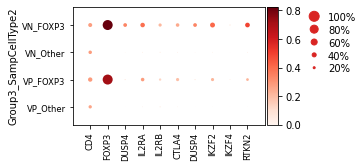

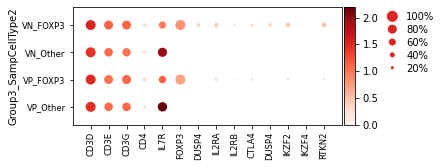

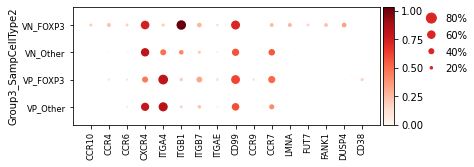

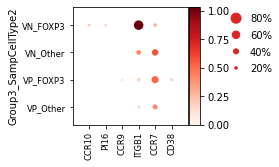

In [56]:
RunAllPlots(adata,'Group3','Treg')


Below, all diferential experession analyses will be performed
-

In [57]:
from pathlib import Path
Path("Excel_outs").mkdir(parents=True, exist_ok=True)

def Run_DE(adata_main,Name,cond,adata=None):
    
    #Part 1: The DE analysis.
    import diffxpy.api as de
    test = de.test.wald(
        data=adata_main,
        formula_loc="~ 1 + "+cond+" + size_factors",
        factor_loc_totest=cond,
        as_numeric=['size_factors']
    )
    
    # Part 2: padj filtering.
    pd1 = test.summary()[test.summary()['qval'] < 0.05]
    
    #Part 3: count expressed cells per gene.
    if adata is None:
        pd1[['Expr_Cells_Chosen_Subset']] = [np.count_nonzero(adata_main.X.T[list(adata_main.var_names).index(x)]) for x in pd1['gene'] ]
    else:
        pd1[['Expr_Cells_Chosen_Subset','Expr_Cells_Entire_Dataset']] = [[np.count_nonzero(adata_main.X.T[list(adata_main.var_names).index(x)]),np.count_nonzero(adata.X.T[list(adata.var_names).index(x)])] for x in pd1['gene'] ]
    
    #Part 4: out put to excel.
    pd1.to_excel("Excel_outs/"+str(Name)+'.xlsx', sheet_name='sheet1', index=True)


In [58]:
Run_DE(Group1_Treg,"Group1_Treg_VP_v_VN","sample",adata)
Run_DE(Group2_Treg,"Group2_Treg_VP_v_VN","sample",adata)
Run_DE(Group3_FOXP3,"Group3_FOXP3+_VP_v_VN","sample",adata)
Run_DE(Group4_Treg,"Group4_Treg_VP_v_VN","sample",adata)
Run_DE(Pos,"Group1_Vedo_Pos_Treg_v_Other","Group1_CellType",adata)
Run_DE(Neg,"Group1_Vedo_Neg_Treg_v_Other","Group1_CellType",adata)
Run_DE(Pos,"Group2_Vedo_Pos_Treg_v_Other","Group2_CellType",adata)

In [59]:
Run_DE(Neg,"Group2_Vedo_Neg_Treg_v_Other","Group2_CellType",adata)
Run_DE(Pos,"Group3_Vedo_Pos_FOXP3+_v_Other","Group3_CellType",adata)
Run_DE(Neg,"Group3_Vedo_Neg_FOXP3+_v_Other","Group3_CellType",adata)
Run_DE(Pos,"Group4_Vedo_Pos_Treg_v_Other","Group4_CellType",adata)
Run_DE(Neg,"Group4_Vedo_Neg_Treg_v_Other","Group4_CellType",adata)
Run_DE("All_VP_v_VN","sample",adata)

In [60]:
#This function is to get the percentage of cells that express a gene per sample.
from pathlib import Path
Path("Excel_outs").mkdir(parents=True, exist_ok=True)
def Run_DE_test(adatatest,adata,Name,cond):
    CondDict = {}
    StoreCounts = {} #In this dict, the counts and percentage of expressed cells per gene are kept.
    abc = adatatest.obs[cond].copy()
    StoreCounts['Gene'] = []
    CondStore = [] # Stores the conditions, in this case Vedo positive and Vedo negative.
    for o in set(abc):
        CondDict[o] = adatatest[adatatest.obs[cond] == o]
        StoreCounts[o+'_Count'] = [] 
        StoreCounts[o+'_Perc'] = []
        CondStore.append(o)
    Rela = False
    if len(set(abc)) == 2: # If there are only two conditions, such is the case in for Vedo positive vs Vedo negative, then we can calculate the relative difference of the percentages for Vedo + and Vedo -.
        StoreCounts['Relative'] = []
        Rela = True

    
    for Gene in adata.var_names:
        StoreCounts['Gene'].append(Gene)
        for k in CondDict:
            #CondDict[k] refers to an anndata matrix where all cells that correspond to condition k in set(anndata.obs[cond]).
            OutpGene = list(CondDict[k].var_names).index(Gene) # Gets the position of the gene in the anndata.var_names. Where anndata is all entries for a certain condition. E.g. when cond == "sample", k is Vedo Positive or Vedo Negative. Thus anndata is the matrix for all vedo positive, or all vedo negative cells.
            CurGeneCount = CondDict[k].X[:, OutpGene] # Gives the matrix corresponding to this gene for all cells in the anndata. 

            NonZeroCount = np.count_nonzero(CurGeneCount) # Get amount of cells expressed > 0. 
            TotalCells = len(CurGeneCount) #Alternatively could have been len(CondDict[k].obs)

            StoreCounts[k+'_Count'].append(NonZeroCount)
            StoreCounts[k+'_Perc'].append(NonZeroCount/TotalCells*100)
            #print(CondDict[k].X[:,])
        if Rela == True: #If there are only conditions stores in anndata.obs[cond], substract the first from the second.
            try:
                StoreCounts['Relative'].append(StoreCounts[CondStore[0]+'_Perc'][-1]-StoreCounts[CondStore[1]+'_Perc'][-1])
            except:
                StoreCounts['Relative'].append("ERROR")
    dframe = pd.DataFrame(data=StoreCounts) #Create pandas dataframe out of dict and write to excel.
    dframe.to_excel("Excel_outs/"+str(Name)+'_ALL_GENES_PERC.xlsx', sheet_name='sheet1', index=True)
    return(dframe)

In [61]:
DframeG1 = Run_DE_test(Group1_Treg,adata,"Group1_Treg_VP_v_VN","sample")
DframeG2 = Run_DE_test(Group2_Treg,adata,"Group2_Treg_VP_v_VN","sample")
DframeG3 = Run_DE_test(Group3_FOXP3,adata,"Group3_FOXP3+_VP_v_VN","sample")
DframeG4 = Run_DE_test(Group4_Treg,adata,"Group4_Treg_VP_v_VN","sample")

In [62]:
#Diffxpy was not able to perform a DE on the entire dataset, as I kept getting a bug with an underlying machinelearning package. Therefore, I used MAST.

In [63]:
adata_test = adata.copy()

adata_test.X = adata.raw.X
adata_test.obs['n_genes'] = (adata_test.X > 0).sum(1)

In [64]:
#I copied this entire section 1 on 1 from https://github.com/theislab/single-cell-tutorial/blob/master/latest_notebook/Case-study_Mouse-intestinal-epithelium_1906.ipynb
%%R -i adata_test -o treg_de -o other_de

#Convert SingleCellExperiment to SingleCellAssay type as required by MAST
sca <- SceToSingleCellAssay(adata_test, class = "SingleCellAssay")

#Scale Gene detection rate
colData(sca)$n_genes = scale(colData(sca)$n_genes)

#Create data subsets for paneth and Enterocyte subpopulations
sca_treg <- subset(sca, with(colData(sca), Group1_SampCellType3=='Treg'))
sca_other <- subset(sca, with(colData(sca), Group1_SampCellType3=='Other'))


#Filter out non-expressed genes in the subsets
print("Dimensions before subsetting:")
print(dim(sca_treg))
print(dim(sca_other))
print("")

sca_treg_filt = sca_treg[rowSums(assay(sca_treg)) != 0, ]
sca_other_filt = sca_other[rowSums(assay(sca_other)) != 0, ]

print("Dimensions after subsetting:")
print(dim(sca_treg_filt))
print(dim(sca_other_filt))


#Define & run hurdle model - Enterocytes
zlmCond_treg <- zlm(formula = ~sample + n_genes, sca=sca_treg_filt)
summaryCond_treg <- summary(zlmCond_treg, doLRT='sampleVP')
summaryDt_treg <- summaryCond_treg$datatable

result_treg <- merge(summaryDt_treg[contrast=='sampleVP' & component=='H',.(primerid, `Pr(>Chisq)`)], #P-vals
                 summaryDt_treg[contrast=='sampleVP' & component=='logFC', .(primerid, coef)],
                 by='primerid') #logFC coefficients

#Correct for multiple testing (FDR correction) and filtering
result_treg[,FDR:=p.adjust(`Pr(>Chisq)`, 'fdr')]
treg_de = result_treg[result_treg$FDR<0.01,, drop=F]
treg_de = treg_de[order(treg_de$FDR),]


#Define & run hurdle model - paneth cells
zlmCond_other <- zlm(formula = ~sample + n_genes, sca=sca_other_filt)
summaryCond_other <- summary(zlmCond_other, doLRT='sampleVP')
summaryDt_other <- summaryCond_other$datatable

result_other <- merge(summaryDt_other[contrast=='sampleVP' & component=='H',.(primerid, `Pr(>Chisq)`)], #P-vals
                 summaryDt_other[contrast=='sampleVP' & component=='logFC', .(primerid, coef)],
                 by='primerid') #logFC coefficients

#Correct for multiple testing (FDR correction) and filtering
result_other[,FDR:=p.adjust(`Pr(>Chisq)`, 'fdr')]
other_de = result_other[result_other$FDR<0.01,, drop=F]
other_de = other_de[order(other_de$FDR),]

In [65]:
dframe_treg = pd.DataFrame(data=treg_de)
dframe_other = pd.DataFrame(data=other_de)

In [66]:
dframe_treg = dframe_treg[abs(dframe_treg['coef']) > 0.1]
dframe_other = dframe_other[abs(dframe_other['coef']) > 0.1]

In [67]:
adata_treg = adata[adata.obs['Group1_SampCellType3'] == "Treg"]
adata_other = adata[adata.obs['Group1_SampCellType3'] == "Other"]
adata_treg_VP = adata_treg[adata_treg.obs['sample'] == "VP"]
adata_treg_VN = adata_treg[adata_treg.obs['sample'] == "VN"]

adata_other_VP = adata_other[adata_other.obs['sample'] == "VP"]
adata_other_VN = adata_other[adata_other.obs['sample'] == "VN"]


In [68]:
#Counting the amount of cells expressed.

dframe_treg[['Expr_Cells_Treg']] = [np.count_nonzero(adata_treg.X.T[list(adata_treg.var_names).index(x)]) for x in dframe_treg['primerid'] ]
dframe_treg[['Expr_Cells_Treg_VN']] = [np.count_nonzero(adata_treg_VN.X.T[list(adata_treg_VN.var_names).index(x)]) for x in dframe_treg['primerid'] ]
dframe_treg[['Expr_Cells_Treg_VP']] = [np.count_nonzero(adata_treg_VP.X.T[list(adata_treg_VP.var_names).index(x)]) for x in dframe_treg['primerid'] ]
dframe_other[['Expr_Cells_other']] = [np.count_nonzero(adata_other.X.T[list(adata_other.var_names).index(x)]) for x in dframe_other['primerid'] ]
dframe_other[['Expr_Cells_other_VN']] = [np.count_nonzero(adata_other_VN.X.T[list(adata_other_VN.var_names).index(x)]) for x in dframe_other['primerid'] ]
dframe_other[['Expr_Cells_other_VP']] = [np.count_nonzero(adata_other_VP.X.T[list(adata_other_VP.var_names).index(x)]) for x in dframe_other['primerid'] ]

In [69]:

dframe_other.to_excel("Excel_outs/MAST_Other_VP_v_VN.xlsx", sheet_name='sheet1', index=True)

dframe_treg.to_excel("Excel_outs/MAST_Treg_VP_v_VN.xlsx", sheet_name='sheet1', index=True)

In [70]:
#END